# Face Completion With Multi-Estimator Output
# Pre-Processing



## The Dataset
This project uses the CelebA Dataset, and specifically it's cropped and aligned folder. Let's display a selection of these photos.

In [1]:
import dask_image.imread
import os
import matplotlib.pyplot as plt
import numpy as np

DATA_ROOT = os.path.join('example', 'inputs', 'initialimagesubset')
all_pictures = dask_image.imread.imread(os.path.join(DATA_ROOT, "0000[0-1]*"))
all_pictures = all_pictures.compute()

fig = plt.figure(figsize=(400,400), constrained_layout=False)
grid = fig.add_gridspec(4, 4, wspace = 0, hspace = 0)

for idx in range(16):
    this_ax = fig.add_subplot(grid[int(idx/4), idx%4])
    this_ax.set(xticks=[], yticks=[])
    this_ax.imshow(all_pictures[idx])

These images, as mentioned, are pre-cropped and aligned. However, we can do better.

## Normalize Image Content
We plan on using the upper half of the face to predict the bottom half. The plan to do this is by using the image's top 128x64 to the image's bottom 128x64. If images are not normalized, we cannot guarantee that the images in the dataset express the same information in their top half. Let's examine four images:

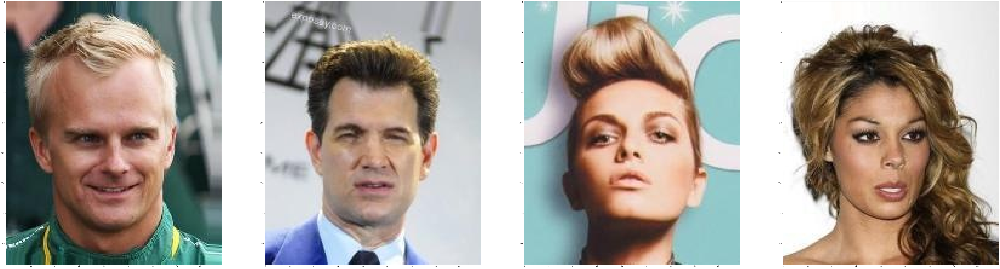

In [2]:
plt.figure(figsize=(100,400))
ax1 = plt.subplot(141)
ax2 = plt.subplot(142)
ax3 = plt.subplot(143)
ax4 = plt.subplot(144)
ax1.imshow(all_pictures[12])
ax2.imshow(all_pictures[14])
ax3.imshow(all_pictures[4])
ax4.imshow(all_pictures[5])
plt.show()

The four images should have much in common, as they are aligned and crop headshots of celebrities. However, the images have varying levels of zoom. They're not fully cropped to the face, so the predictions have noise they would be predicting on. And the top and bottom half of each image do not correspond to the top and bottom half of the face. Ideally, this would be the case. So, the pre-processing will function to find a face in any picture, align to it, crop it, scale it to the same size as the other pictures, then ensure that the top and bottom half of the images correspond to the top and bottom half of the face

### Align the face using MediaPipe's facial landmarks
To align to the face, we first need to find the face. To do this, Google's MediaPipe ML Library is run on the on the image to find the face in it. Using the landmarks generated by this process, we can align the images to the associated pixels. Let's showcase this with the 4th image.

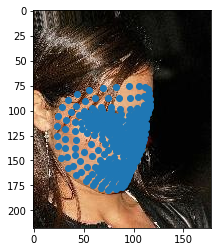

In [3]:
import mediapipe as mp
import cv2

pic4 = all_pictures[3]

# Process the image with mediapipe
with mp.solutions.face_mesh.FaceMesh(static_image_mode=True, max_num_faces=1, refine_landmarks=False,
                                            min_detection_confidence=.5) as face_mesh:
    multi_face = face_mesh.process(pic4)
    face_landmarks = multi_face.multi_face_landmarks[0]

# The landmarks are actually normalized by the total image size
# Put them back into their real points
image_x = pic4.shape[1]
image_y = pic4.shape[0]
landmarks = np.array([[landmark.x * image_x, landmark.y * image_y]
                       for landmark in face_landmarks.landmark])
# Before continuing with alignment, let's save the z landmarks for later
# and normalize to [0, 254]
landmarks_z = np.array([landmark.y for landmark in face_landmarks.landmark])
landmarks_z = (landmarks_z - np.min(landmarks_z)) / \
               (np.max(landmarks_z) - np.min(landmarks_z)) * 254
# Plot the face and landmarks
plt.imshow(pic4)
plt.scatter(landmarks[:, 0], landmarks[:, 1])
plt.show()

MediaPipe will always generate points in the same order, in accordance to certain points on the face. 3 points important to our purposes can be found. One is point 5, which should be a good midpoint for face image analysis, and lies on the nose. The other two are points 454 and 234, which lie next to the ear on the points respective sides of the face. If the face is properly aligned, the slope of these two points should be 0. Let's align the face with these points.We can see these points in the following image:


<img src="canonical_face_model_uv_visualization_marked.png" width="256" height="256" align="left">




With this in mind, let's align the image and landmarks by rotating the image such that:
$$
\arctan(\frac{y_{454}-y_{234}}{x_{454}-x_{234}})  = 0
$$

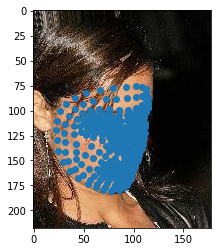

In [4]:
# Save indexes
nose_idx = 5
cheekL_idx = 234
cheekR_idx = 454
nose_point = landmarks[nose_idx]

# Calculate rotation angle
slope = (landmarks[cheekR_idx][1] - landmarks[cheekL_idx][1])/ \
        (landmarks[cheekR_idx][0] - landmarks[cheekL_idx][0])
angle = np.arctan(slope)

# Rotate the image
rot_mat = cv2.getRotationMatrix2D(nose_point, np.degrees(angle), 1.0)
aligned_image = cv2.warpAffine(pic4, rot_mat, pic4.shape[1::-1], flags=cv2.INTER_LINEAR)

# Rotate the landmarks
p_mat = np.array([[np.cos(angle), -np.sin(angle)],
                  [np.sin(angle), np.cos(angle)]
                 ])
aligned_landmarks = (p_mat @ (landmarks - nose_point).T).T + nose_point

# Plot the face and landmarks
plt.imshow(pic4)
plt.scatter(aligned_landmarks[:, 0], aligned_landmarks[:, 1])
plt.show()

### Crop the image and landmarks
Cropping the image is comparatively simple. To crop, we need to find the min and max over each axis, then take these points and use them to crop the image. After this, subtract the mins from each landmark.

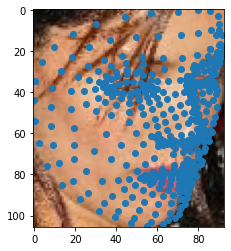

In [5]:
# Get the mins and max over x,y
face_shape = np.array([[np.min(aligned_landmarks[:, 0]), np.max(aligned_landmarks[:, 0])],
                       [np.min(aligned_landmarks[:, 1]), np.max(aligned_landmarks[:, 1])]])
# Crop the image
pic4 = aligned_image[int(face_shape[1][0]):int(face_shape[1][1] + 1),
                     int(face_shape[0][0]):int(face_shape[0][1] + 1)]
# Crop the landmarks
cropped_landmarks = aligned_landmarks - [face_shape[0][0], face_shape[1][0]]
cropped_face_shape = np.array([[0, face_shape[0][1] - face_shape[0][0]],
                               [0, face_shape[1][1] - face_shape[1][0]]])
# Plot the face and landmarks
plt.imshow(pic4)
plt.scatter(cropped_landmarks[:, 0], cropped_landmarks[:, 1])
plt.show()

### Scale the face to (128, 128)
Simply renormalize the values over x and y to [0, 127]

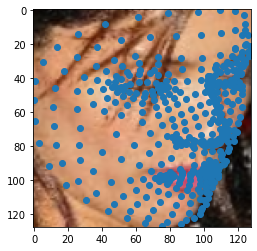

In [6]:
# Re-scale
pic4 = cv2.resize(pic4, [128, 128])
scaled_landmarks = cropped_landmarks / np.array([[cropped_face_shape[0][1]],
                        [cropped_face_shape[1][1]]]).T * np.array([127, 127])
# Plot the face and landmarks
plt.imshow(pic4)
plt.scatter(scaled_landmarks[:, 0], scaled_landmarks[:, 1])
plt.show()

### Warp the image
Lastly, we need to make it so the top and bottom half of the image correspond to the top and bottom half of the face. Here as the difference between the point on the nose, and midpoint of the image:

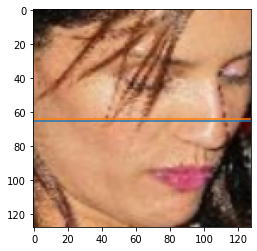

In [7]:
# Get the y pixel of the nose
scaled_nose_pixel = int(scaled_landmarks[nose_idx][1])

# Plot image against lines
plt.imshow(pic4)
str_line = np.array([scaled_nose_pixel for x in range(128)])
mid_line = np.array([64 for x in range(128)])
plt.plot(str_line)
plt.plot(mid_line)
plt.show()

To do this, we will use the nose mid-point at the center line in y axis and resize the two two halves of the face so they fit around the center line.

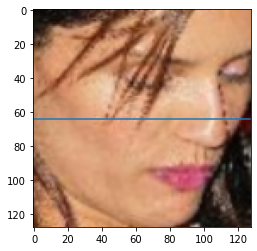

In [8]:
# Rescale both sides so that the nose is at 
pic4 = np.concatenate((cv2.resize(pic4[:scaled_nose_pixel][0:127], (128, 64)),
                       cv2.resize(pic4[scaled_nose_pixel:][0:127], (128, 64))))

# Plot image against lines
plt.imshow(pic4)
mid_line = np.array([64 for x in range(128)])
plt.plot(mid_line)
plt.show()

We no longer need the landmarks. But, let's save them as an image, where the RGB values represents the normalized value of z from [0,255]. This can be used in future work. (Note: this is, in reality, done after the face is flipped)

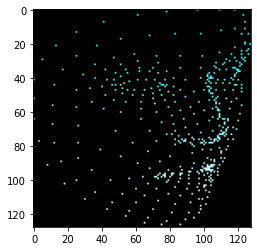

In [9]:
# Warp the landmarks and plot them onto an image
warp_point_map = np.array([[[0, 0, 0] for _ in range(128)] for _ in range(128)])
for idx, org_point in enumerate(scaled_landmarks):
    if int(org_point[1]) <= scaled_nose_pixel:
        point = [org_point[0], org_point[1] * (64 / scaled_nose_pixel)]
    else:
        point = [org_point[0], 64 + 64 * ((org_point[1] - scaled_nose_pixel) / (128 - scaled_nose_pixel))]
    if warp_point_map[int(point[1])][int(point[0])].any():
        warp_point_map[int(point[1])][int(point[0])][1] = landmarks_z[idx]
    warp_point_map[int(point[1])][int(point[0])] = [landmarks_z[idx], 255, 255]

plt.imshow(warp_point_map)
plt.show()

## Lower Image Variation
Our dataset has an incredible number of permutations, even at (128,128). On the each half of the image, the space where we are planning on making predictions, there are 135,834,624,000 possible permutations of RGB values. There are certainly not that many facial images at our disposal (my RAM chips are thankful), but we can still benefit from lowering the variation a bit. 

### Flip the face if the subject is looking right
If two images are the same, but flipped, our estimators should not need to have double the amount of data to accurately predict the same bottom half. On top of that, it should cut variation down by making angled faces more similar to one another.

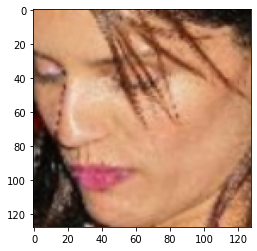

In [10]:
# If the nose point is on the right, simply flip the image and landmarks
if scaled_landmarks[nose_idx][0] > 64:
    scaled_landmarks = np.array([[127 - pt[0], pt[1]] for pt in scaled_landmarks])
    pic4 = cv2.flip(pic4, 1)
    
# Plot again
plt.imshow(pic4)
plt.show()

## Convert to grayscale
Variation can be cut down by 16 times, simply by converting to perceived luminance, or grayscale. It also drops the number of outputs that need to be predicted by our estimators by a third. (This is actually done on load in the regressors section, more efficiently by dask. This is simply a showcase).

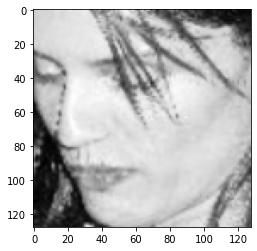

In [11]:
# if this has already been run, cv2 will throw an exception
# the exception is, mind boggling, raised as "error"
# that is not ideal, but it should be fine here to eat all exceptions
try:
    pic4 = cv2.cvtColor(pic4, cv2.COLOR_RGB2GRAY)
except:
    pass

plt.imshow(pic4, cmap='Greys_r')
plt.show()

## Final Comparison between input and output
With all this done, let's compare the input to the pre-processing to the output.

In [13]:
# Load pre-preprocessed images in
OUT_ROOT = os.path.join('example', 'inputs', 'warpedimagesubset', 'images')
out_pictures = dask_image.imread.imread(os.path.join(OUT_ROOT, "00000*"))

# Convert with dask rather than cv2
def grayscale(rgb):
    return ((rgb[..., 0] * 0.2126) +
            (rgb[..., 1] * 0.7152) +
            (rgb[..., 2] * 0.0722))
out_pictures = grayscale(out_pictures).compute()

fig = plt.figure(figsize=(400,400), constrained_layout=False)
grid = fig.add_gridspec(4, 4, wspace = 0, hspace = 0)

for idx in range(8):
    this_ax = fig.add_subplot(grid[int(2*idx/4), (2*idx)%4])
    this_ax.set(xticks=[], yticks=[])
    this_ax.imshow(all_pictures[idx])
    next_ax = fig.add_subplot(grid[int(2*idx/4), (2*idx+1)%4])
    next_ax.set(xticks=[], yticks=[])
    next_ax.imshow(out_pictures[idx], cmap='Greys_r')
    


Now, the top and bottom half of the image are guaranteed to be the top and bottom halfs of the faces. Image 5 is a good example of the face warping in action. It may look strange, but this is what we want. On top of have the lower half of the face take up half the image, we want the results to closely align not only to the face shape but to the looking direction of the subject. These extreme outliers should lump together, although we would prefer to have enough data that they are not outliers altogether.

## A Note On Future Work
The biggest lingering concern I have is the extra noise of pixels that are not part of the face. I could likely tesselate over the nearest landmark neighbors for each pixel and do some sort of pathfinding around the outside of the face to remove that data. However, this seems decently complex, and would take me some time. 

[Return Home](./project_home.ipynb).

[Estimators](./estimators.ipynb).
